# Figure 1: Assessment of the new method: cerebellum-specific ALE (C-SALE).
### Date: 05.08.2024

### **Note** that this notebook relies on ALE and C-SALE analyes and other previous output, such as the whole-brain probability distribution (the sum of foci kernels). 
#### With that, it also relies on the underlying **BrainMap data** (the February 2024 dump), obtained by **Collaborative Use Agreement** by the authors (https://www.brainmap.org/collaborations).
#### Since these data may not be shared directly outside of the BrainMap platform, the raw data are **not provided in the GitHub repository** (https://www.github.com/NevMagi/cerebellum-specific-ALE). 

#### We nonetheless show our strategy for obtaining derivitives directly from these data **(in case the user has access to them)** ..
#### .. and provide the initial derivatives directly so the user can continue reproducing results **(in cases without access to these data)**.

TODO: Add an optional code chunk to load in derivitive data (e.g. kernels sum) when users have no access to the BrainMap data.

We compared the distributions of voxels to those of foci (1a), and significant voxels (Supplements).
We update the null hypothesis in our new method, also illustrating the classic method (1b).
Then, we show results of behavioral domain-level analysis, with classic ALE (c) and C-SALE (d).
Lastly, we assess spatial correlations between domains and subdomains for ALE (e) and C-SALE (f) (+ Connected Supplements).

In [1]:
import os
import glob
import sys
import re
import json
import nimare
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import seaborn as sns
from nilearn import plotting
import nilearn.maskers
import nilearn.image
import nilearn.surface
import nibabel
import itertools
import scipy
from tqdm import tqdm
import nimare_gpu
import SUITPy.flatmap
import scipy.cluster.hierarchy as sch
import warnings
warnings.filterwarnings("ignore")

# Define base directory of the project which is the parent of scripts folder
BASE_DIR = os.path.abspath('../..')
sys.path.append(os.path.join(BASE_DIR, 'scripts'))

import utils

# Defines input and output paths.
INPUT_DIR = os.path.join(BASE_DIR, 'input')
OUTPUT_DIR = os.path.join(BASE_DIR, 'output')

# Set up font style
plt.rcParams["font.family"] = "Asana Math"
plt.rcParams["font.size"] = 14
plt.rcParams["figure.dpi"] = 300

Create a mask of cerebellum based on Driedrichsen et al. 2009 atlas: (Before running this make sure that the `cerebellar_maps` submodule is pulled)

In [2]:
cerebellum_mask = utils.create_Diedrichsen2009_mask('MNI', dilation=0) 

Load XYZ of all coordinates reported in BrainMap within the cerebellar mask:

In [3]:
dump_path = os.path.join(INPUT_DIR, 'BrainMap_dump_Feb2024.pkl.gz')
xyz_cerebellum = utils.get_null_xyz(
    dump_path,
    cerebellum_mask,
    unique=False
)

In [4]:
# get MNI coordinates of all cerebellum voxels (2mm space to reduce computational costs)
cerebellum_mask_img = nibabel.load(cerebellum_mask)
mask_ijk = np.vstack(np.where(cerebellum_mask_img.get_fdata() > 0)).T
mask_xyz = nibabel.affines.apply_affine(cerebellum_mask_img.affine, mask_ijk)

# 1a. Foci and Voxel Distributions across Z axis

Text(7.697497655493298, 0.0018658780283219057, '$\\mathit{Superior}$')

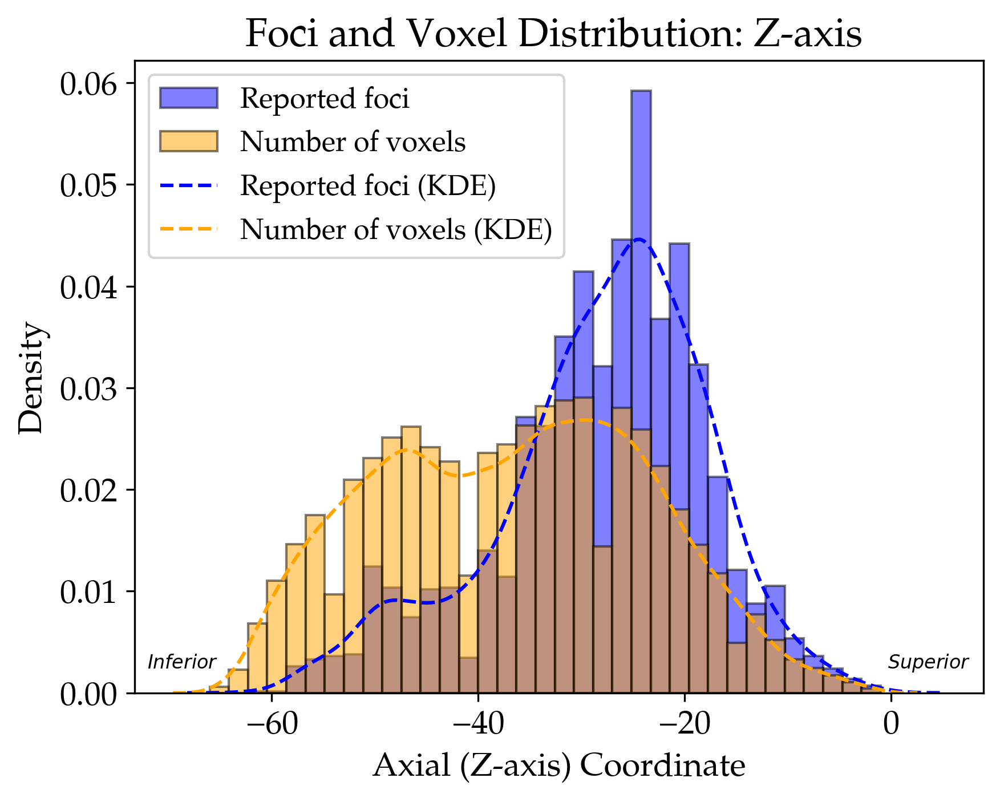

In [5]:
# Determine bins for the histograms based on both foci and voxels
bins = np.histogram_bin_edges(np.concatenate([xyz_cerebellum[:, 2], mask_xyz[:, 2]]), bins=35)

# Plot the histogram for the reported effects
plt.hist(xyz_cerebellum[:, 2], bins=bins, density=True, alpha=0.5, label='Reported foci', color='blue', edgecolor='black')

# Plot the histogram for the number of voxels
plt.hist(mask_xyz[:, 2], bins=bins, density=True, alpha=0.5, label='Number of voxels', color='orange', edgecolor='black')

# Optionally, add KDE for smoothed distribution
sns.kdeplot(xyz_cerebellum[:, 2], color='blue', label='Reported foci (KDE)', linestyle='--')
sns.kdeplot(mask_xyz[:, 2], color='orange', label='Number of voxels (KDE)', linestyle='--')

# Add legend and labels
plt.legend(fontsize=12, loc='upper left', bbox_to_anchor=(0.0, 1))
plt.xlabel('Axial (Z-axis) Coordinate')
plt.ylabel('Density')
plt.title('Foci and Voxel Distribution: Z-axis ')

# Add manual labels on the bottom left and right corners with offset
x_offset = 0.015 * (plt.xlim()[1] - plt.xlim()[0])
y_offset = 0.03 * (plt.ylim()[1] - plt.ylim()[0])

plt.text(x=plt.xlim()[0] + x_offset, y=plt.ylim()[0] + y_offset, 
         s='$\mathit{Inferior}$', ha='left', va='bottom', fontsize=8)
plt.text(x=plt.xlim()[1] - x_offset, y=plt.ylim()[0] + y_offset, 
         s='$\mathit{Superior}$', ha='right', va='bottom', fontsize=8)

# S1a. Foci and Voxel Distributions across X-axis

Text(73.09237415344703, 0.0005797635351836751, '$\\mathit{Right}$')

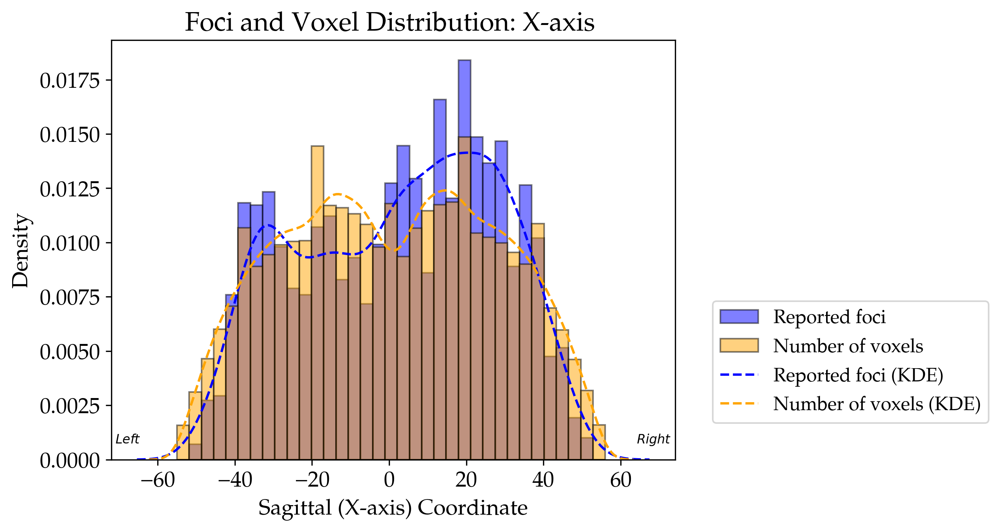

In [6]:
# Determine bins for the histograms based on both foci and voxels
bins = np.histogram_bin_edges(np.concatenate([xyz_cerebellum[:, 0], mask_xyz[:, 0]]), bins=35)

# Plot the histogram for the reported effects
plt.hist(xyz_cerebellum[:, 0], bins=bins, density=True, alpha=0.5, label='Reported foci', color='blue', edgecolor='black')

# Plot the histogram for the number of voxels
plt.hist(mask_xyz[:, 0], bins=bins, density=True, alpha=0.5, label='Number of voxels', color='orange', edgecolor='black')

# Optionally, add KDE for smoothed distribution
sns.kdeplot(xyz_cerebellum[:, 0], color='blue', label='Reported foci (KDE)', linestyle='--')
sns.kdeplot(mask_xyz[:, 0], color='orange', label='Number of voxels (KDE)', linestyle='--')

# Add legend and labels
plt.legend(fontsize=12, loc='upper left', bbox_to_anchor=(1.05, 0.4))
plt.xlabel('Sagittal (X-axis) Coordinate')
plt.ylabel('Density')
plt.title('Foci and Voxel Distribution: X-axis ')

# Add manual labels on the bottom left and right corners with offset
x_offset = 0.007 * (plt.xlim()[1] - plt.xlim()[0])
y_offset = 0.03 * (plt.ylim()[1] - plt.ylim()[0])

plt.text(x=plt.xlim()[0] + x_offset, y=plt.ylim()[0] + y_offset, 
         s='$\mathit{Left}$', ha='left', va='bottom', fontsize=8)
plt.text(x=plt.xlim()[1] - x_offset, y=plt.ylim()[0] + y_offset, 
         s='$\mathit{Right}$', ha='right', va='bottom', fontsize=8)

# S1b. Foci and Voxel Distributions across Y-axis

Text(-19.378111110497255, 0.0012788756469154705, '$\\mathit{Anterior}$')

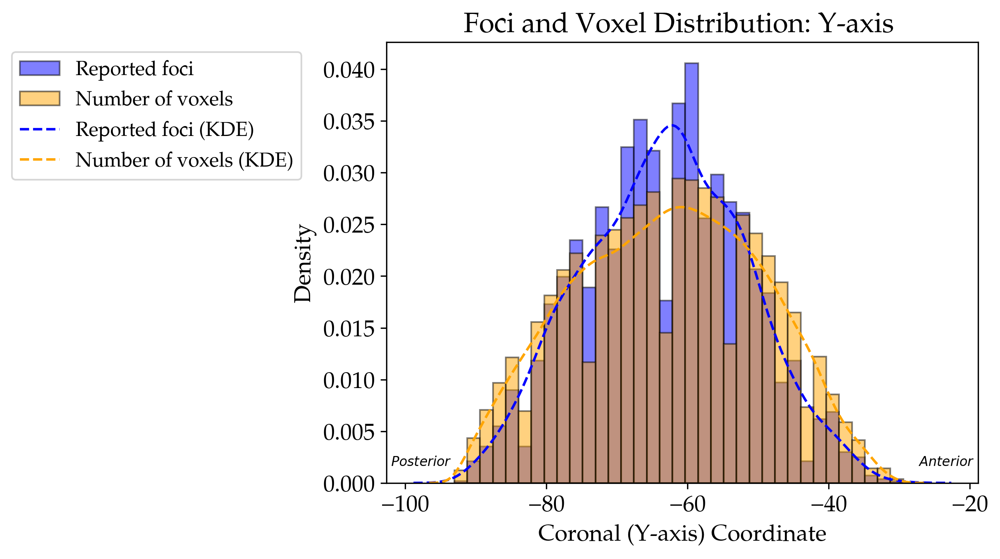

In [7]:
# Determine bins for the histograms based on both foci and voxels
bins = np.histogram_bin_edges(np.concatenate([xyz_cerebellum[:, 1], mask_xyz[:, 1]]), bins=35)

# Plot the histogram for the reported effects
plt.hist(xyz_cerebellum[:, 1], bins=bins, density=True, alpha=0.5, label='Reported foci', color='blue', edgecolor='black')

# Plot the histogram for the number of voxels
plt.hist(mask_xyz[:, 1], bins=bins, density=True, alpha=0.5, label='Number of voxels', color='orange', edgecolor='black')

# Optionally, add KDE for smoothed distribution
sns.kdeplot(xyz_cerebellum[:, 1], color='blue', label='Reported foci (KDE)', linestyle='--')
sns.kdeplot(mask_xyz[:, 1], color='orange', label='Number of voxels (KDE)', linestyle='--')

# Add legend and labels
plt.legend(fontsize=12, loc='upper left', bbox_to_anchor=(-0.65, 1))
plt.xlabel('Coronal (Y-axis) Coordinate')
plt.ylabel('Density')
plt.title('Foci and Voxel Distribution: Y-axis ')

# Add manual labels on the bottom left and right corners with offset
x_offset = 0.007 * (plt.xlim()[1] - plt.xlim()[0])
y_offset = 0.03 * (plt.ylim()[1] - plt.ylim()[0])

plt.text(x=plt.xlim()[0] + x_offset, y=plt.ylim()[0] + y_offset, 
         s='$\mathit{Posterior}$', ha='left', va='bottom', fontsize=8)
plt.text(x=plt.xlim()[1] - x_offset, y=plt.ylim()[0] + y_offset, 
         s='$\mathit{Anterior}$', ha='right', va='bottom', fontsize=8)

# S22. Voxel and Domain-Specific Foci Distributions

Load data:

In [8]:
# Initialize the dsets dictionary
domains = ['Action', 'Cognition', 'Emotion', 'Perception', 'Interoception']

# Initialize the xyz_dict dictionary and keep coordinates for each domain
xyz_cerebellum_dict = {}
for domain in domains:
    # load dataset
    dset = nimare.dataset.Dataset.load(os.path.join(OUTPUT_DIR, 'data', domain, domain, 'dset.pkl.gz'))
    # filter to cerebellum mask
    dset = utils.filter_coords_to_mask(dset, cerebellum_mask_img)
    # get xyz's as an array
    xyz_cerebellum_dict[domain] = dset.coordinates[['x', 'y', 'z']].values

Mask affine does not match Dataset affine. Assuming same space.


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1254/1254 [00:00<00:00, 1361.63it/s]


Mask affine does not match Dataset affine. Assuming same space.


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2861/2861 [00:02<00:00, 1360.78it/s]


Mask affine does not match Dataset affine. Assuming same space.


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 709/709 [00:00<00:00, 1352.99it/s]


Mask affine does not match Dataset affine. Assuming same space.


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1225/1225 [00:00<00:00, 1359.08it/s]


Mask affine does not match Dataset affine. Assuming same space.


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 265/265 [00:00<00:00, 1345.87it/s]


# S22a. Domain-specific distributions along the X-axis

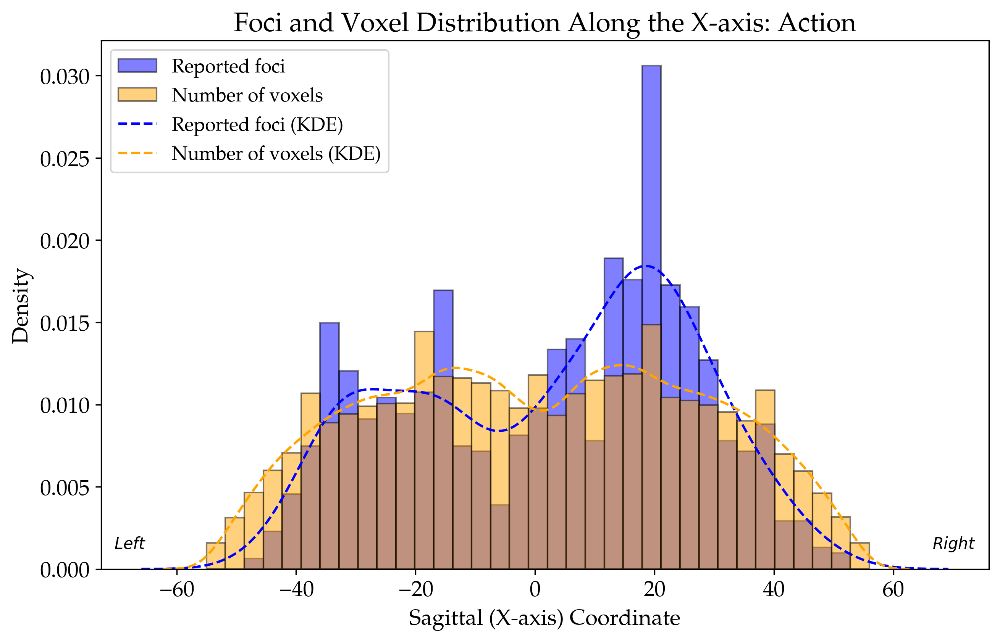

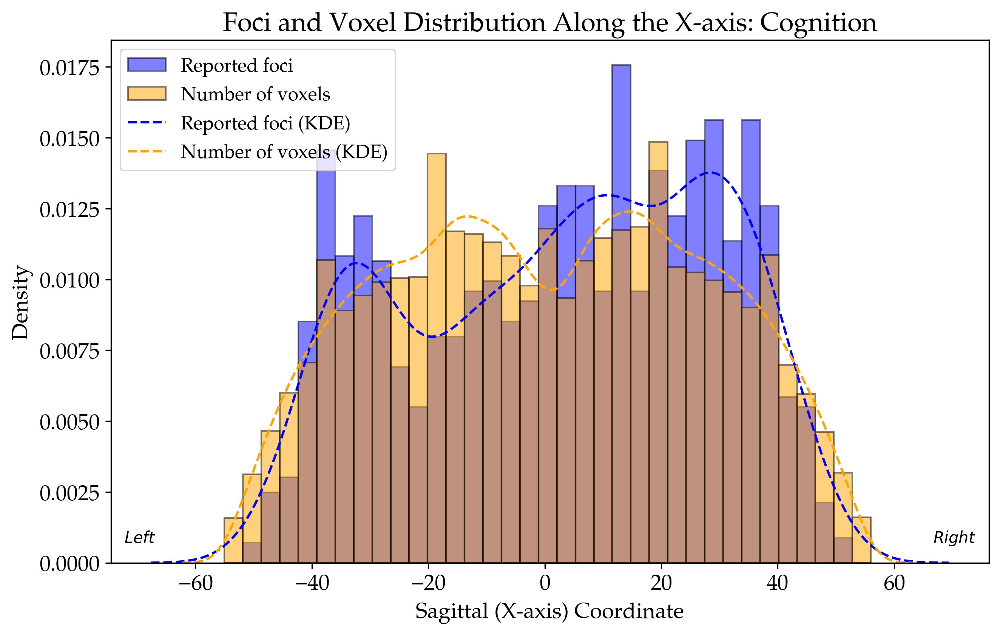

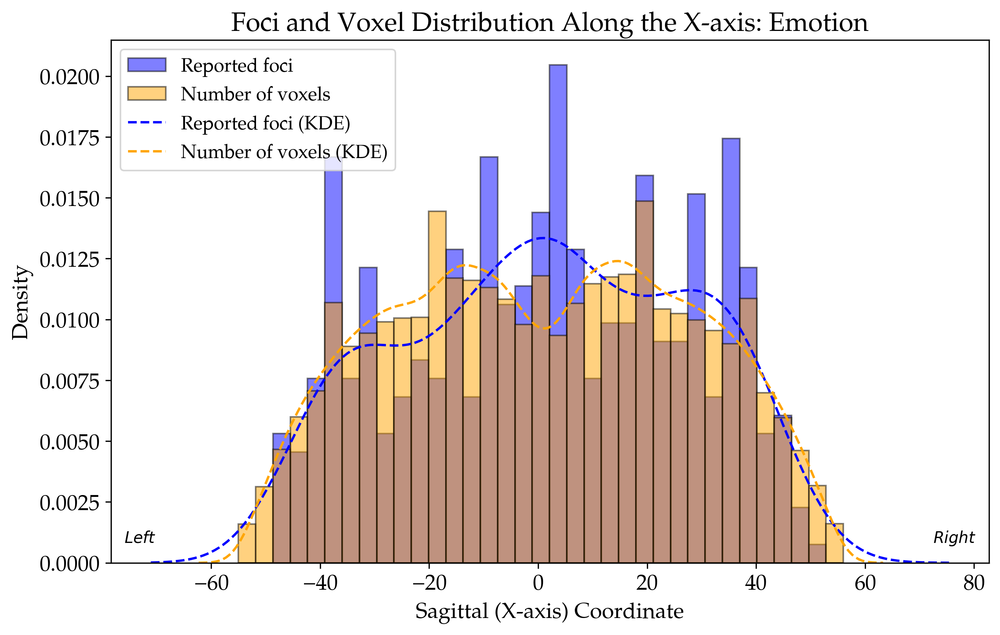

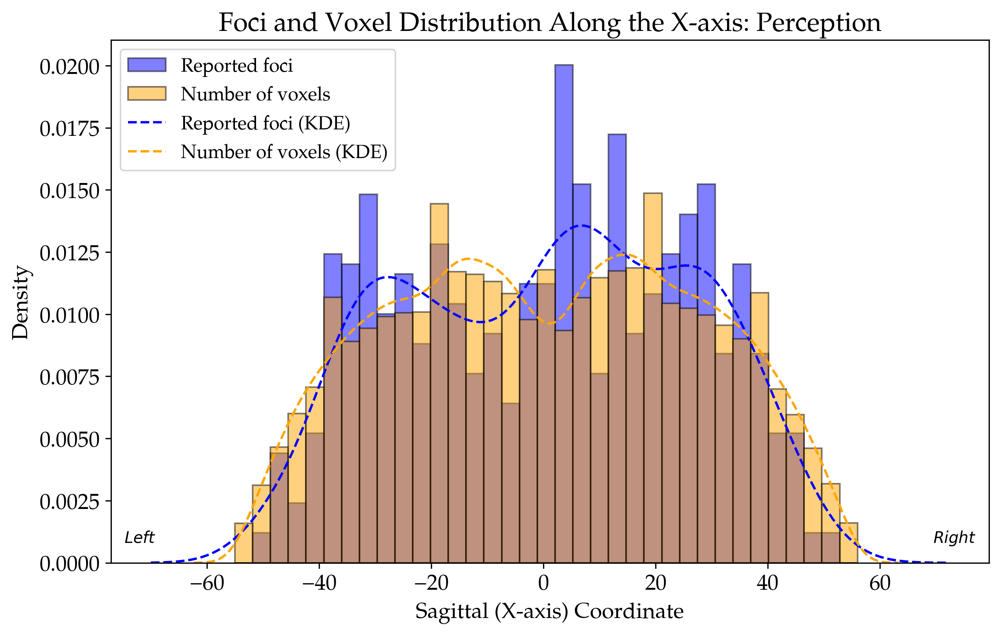

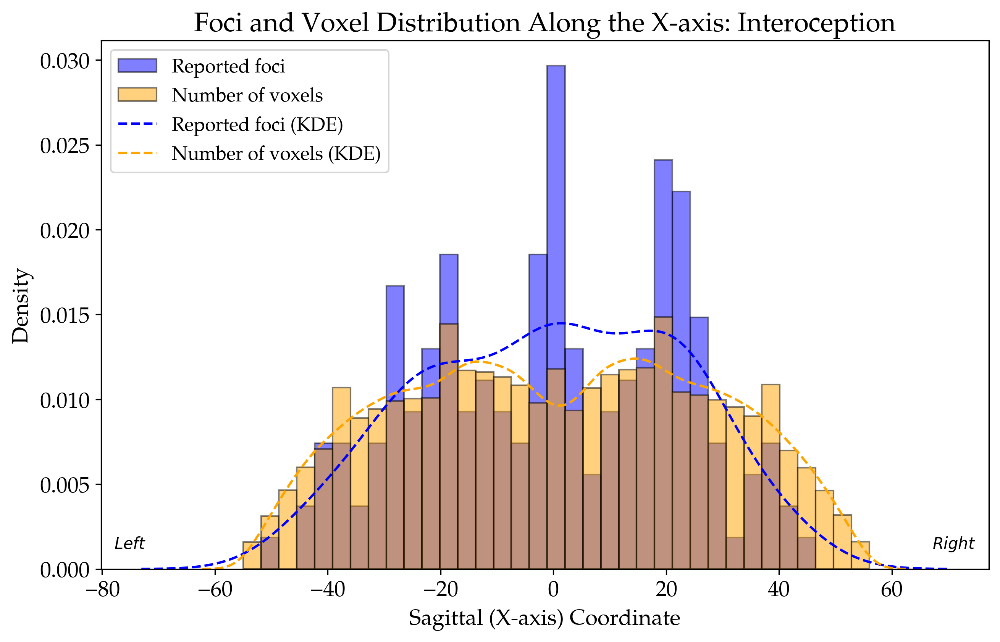

In [9]:
# Define bins using the x-coordinates from all domains and the mask
all_x_coords = np.concatenate([xyz_cerebellum_dict[domain][:, 0] for domain in domains] + [mask_xyz[:, 0]])
bins = np.histogram_bin_edges(all_x_coords, bins=35)

# Plot the histograms for each domain in separate figures
for domain in domains:
    plt.figure(figsize=(10, 6))

    # Determine common bin edges for the histograms
    bins = np.histogram_bin_edges(np.concatenate([xyz_cerebellum_dict[domain][:, 0], mask_xyz[:, 0]]), bins=35)
    
    # Plot the histogram for the reported effects
    plt.hist(xyz_cerebellum_dict[domain][:, 0], bins=bins, density=True, alpha=0.5, label='Reported foci', color='blue', edgecolor='black')
    
    # Plot the histogram for the number of voxels
    plt.hist(mask_xyz[:, 0], bins=bins, density=True, alpha=0.5, label='Number of voxels', color='orange', edgecolor='black')
    
    # Optionally, add KDE for smoothed distribution
    sns.kdeplot(xyz_cerebellum_dict[domain][:, 0], color='blue', label='Reported foci (KDE)', linestyle='--')
    sns.kdeplot(mask_xyz[:, 0], color='orange', label='Number of voxels (KDE)', linestyle='--')
    
    # Add legend and labels
    plt.legend(fontsize = 12, loc='upper left', bbox_to_anchor=(0.0, 1))
    plt.xlabel('Sagittal (X-axis) Coordinate')
    plt.ylabel('Density')
    plt.title(f'Foci and Voxel Distribution Along the X-axis: {domain.capitalize()}')

    # Add manual labels on the bottom left and right corners with offset
    x_offset = 0.015 * (plt.xlim()[1] - plt.xlim()[0])
    y_offset = 0.03 * (plt.ylim()[1] - plt.ylim()[0])
    
    plt.text(x=plt.xlim()[0] + x_offset, y=plt.ylim()[0] + y_offset, 
             s='$\mathit{Left}$', ha='left', va='bottom', fontsize=10)
    plt.text(x=plt.xlim()[1] - x_offset, y=plt.ylim()[0] + y_offset, 
             s='$\mathit{Right}$', ha='right', va='bottom', fontsize=10)

# S22b. Domain-specific distributions along the Y-axis

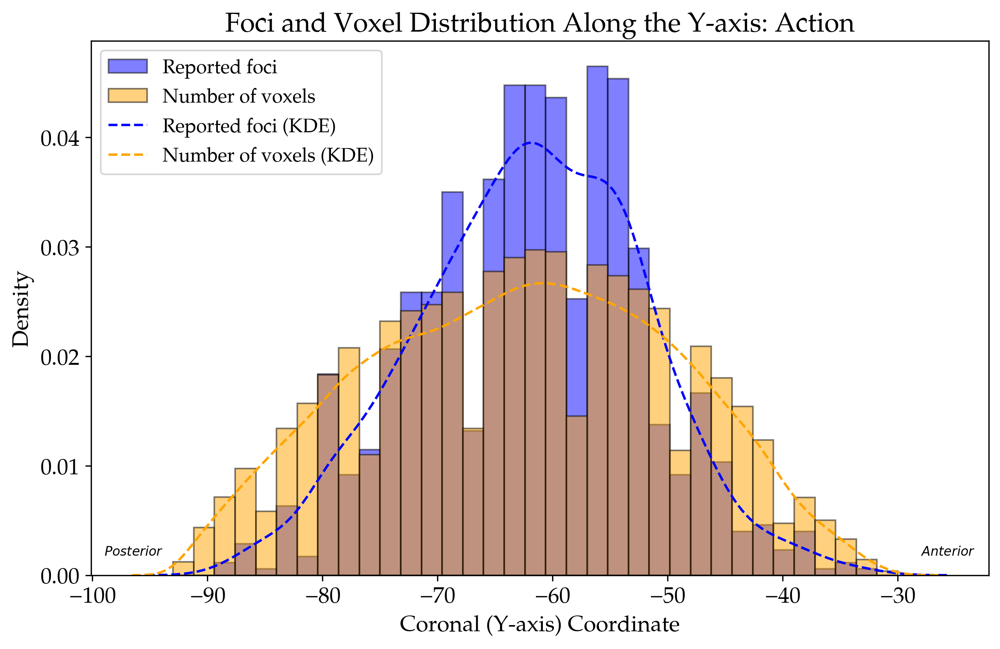

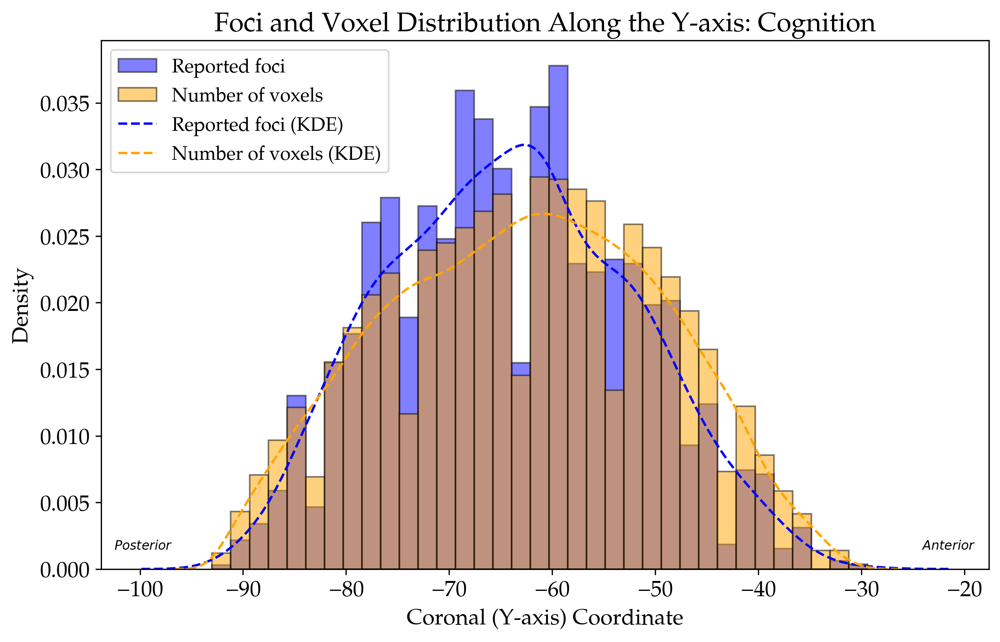

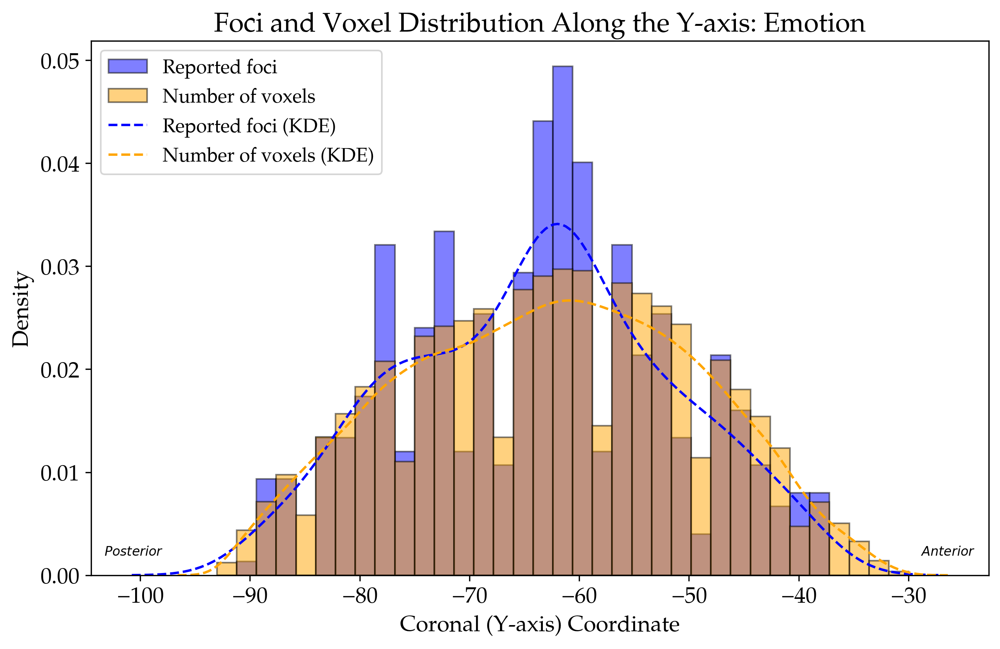

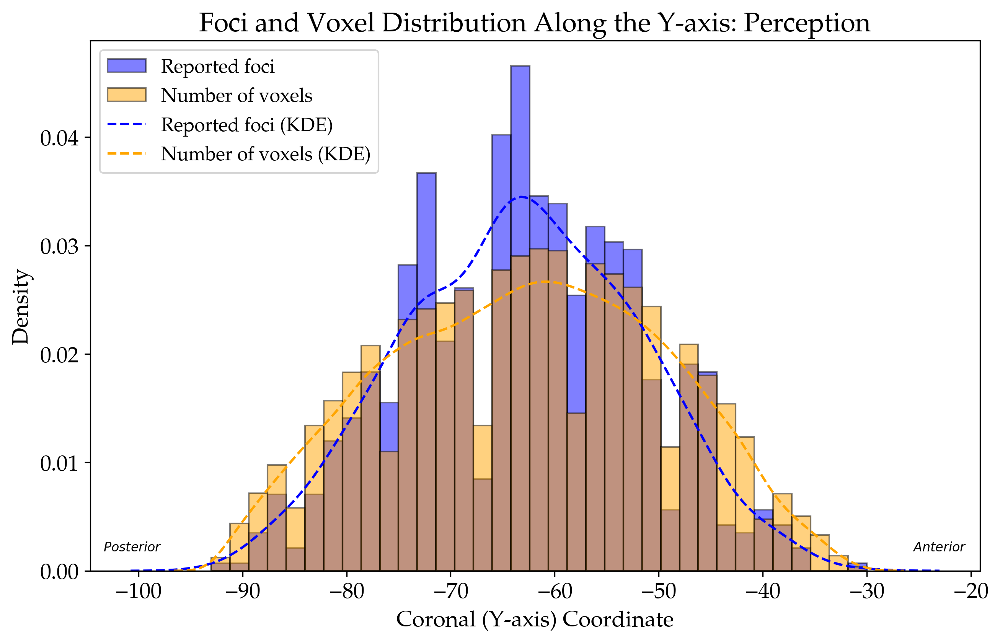

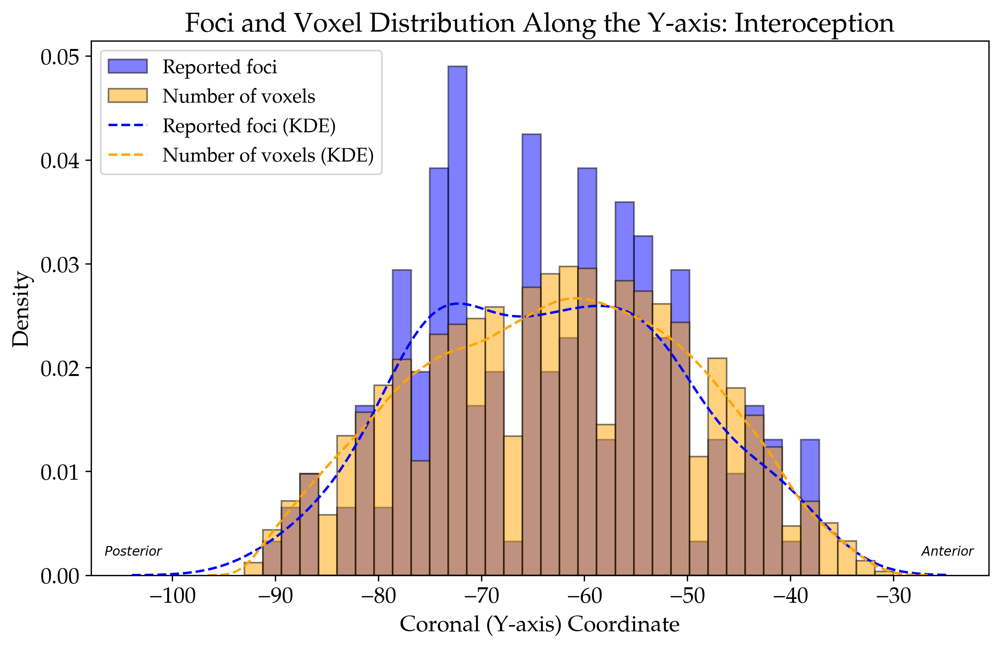

In [10]:
# Define bins using the y-coordinates from all domains and the mask
all_y_coords = np.concatenate([xyz_cerebellum_dict[domain][:, 1] for domain in domains] + [mask_xyz[:, 1]])
bins = np.histogram_bin_edges(all_y_coords, bins=35)

# Plot the histograms for each domain in separate figures
for domain in domains:
    plt.figure(figsize=(10, 6))

    # Determine common bin edges for the histograms
    bins = np.histogram_bin_edges(np.concatenate([xyz_cerebellum_dict[domain][:, 1], mask_xyz[:, 1]]), bins=35)
    
    # Plot the histogram for the reported effects
    plt.hist(xyz_cerebellum_dict[domain][:, 1], bins=bins, density=True, alpha=0.5, label='Reported foci', color='blue', edgecolor='black')
    
    # Plot the histogram for the number of voxels
    plt.hist(mask_xyz[:, 1], bins=bins, density=True, alpha=0.5, label='Number of voxels', color='orange', edgecolor='black')
    
    # Optionally, add KDE for smoothed distribution
    sns.kdeplot(xyz_cerebellum_dict[domain][:, 1], color='blue', label='Reported foci (KDE)', linestyle='--')
    sns.kdeplot(mask_xyz[:, 1], color='orange', label='Number of voxels (KDE)', linestyle='--')
    
    # Add legend and labels
    plt.legend(fontsize = 12, loc='upper left', bbox_to_anchor=(0.0, 1))
    plt.xlabel('Coronal (Y-axis) Coordinate')
    plt.ylabel('Density')
    plt.title(f'Foci and Voxel Distribution Along the Y-axis: {domain.capitalize()}')

    # Add manual labels on the bottom left and right corners with offset
    x_offset = 0.015 * (plt.xlim()[1] - plt.xlim()[0])
    y_offset = 0.03 * (plt.ylim()[1] - plt.ylim()[0])
    
    plt.text(x=plt.xlim()[0] + x_offset, y=plt.ylim()[0] + y_offset, 
             s='$\mathit{Posterior}$', ha='left', va='bottom', fontsize=8)
    plt.text(x=plt.xlim()[1] - x_offset, y=plt.ylim()[0] + y_offset, 
             s='$\mathit{Anterior}$', ha='right', va='bottom', fontsize=8)

# S22c. Domain-specific distributions along the Z-axis

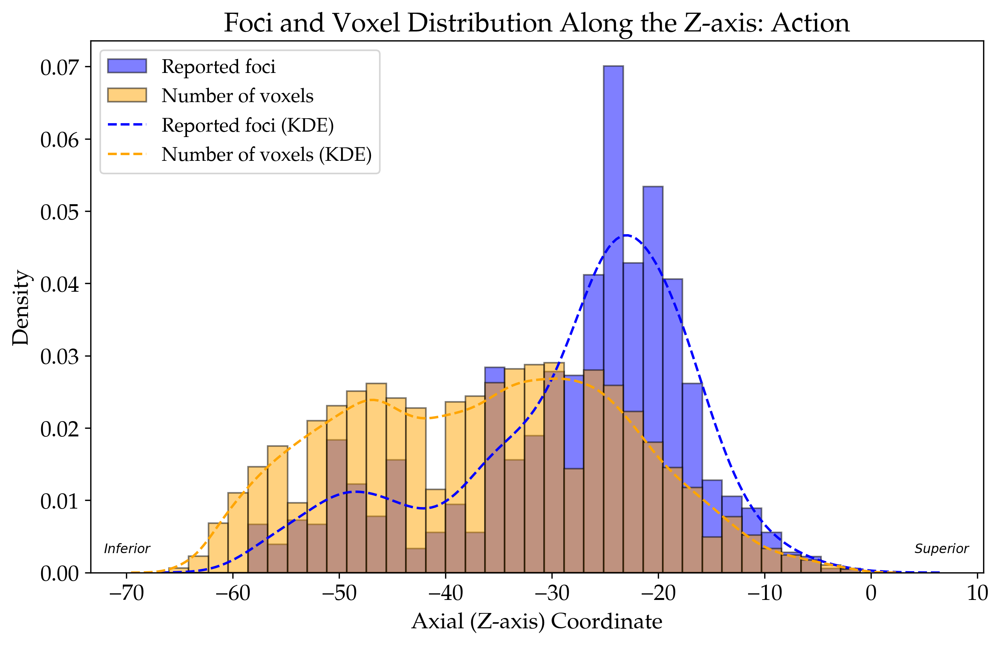

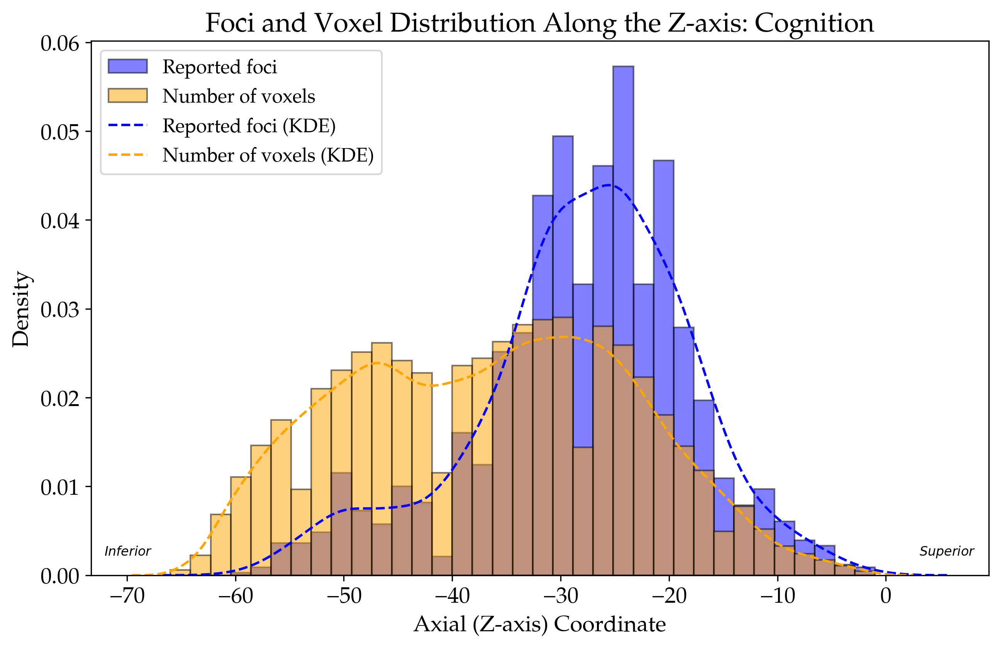

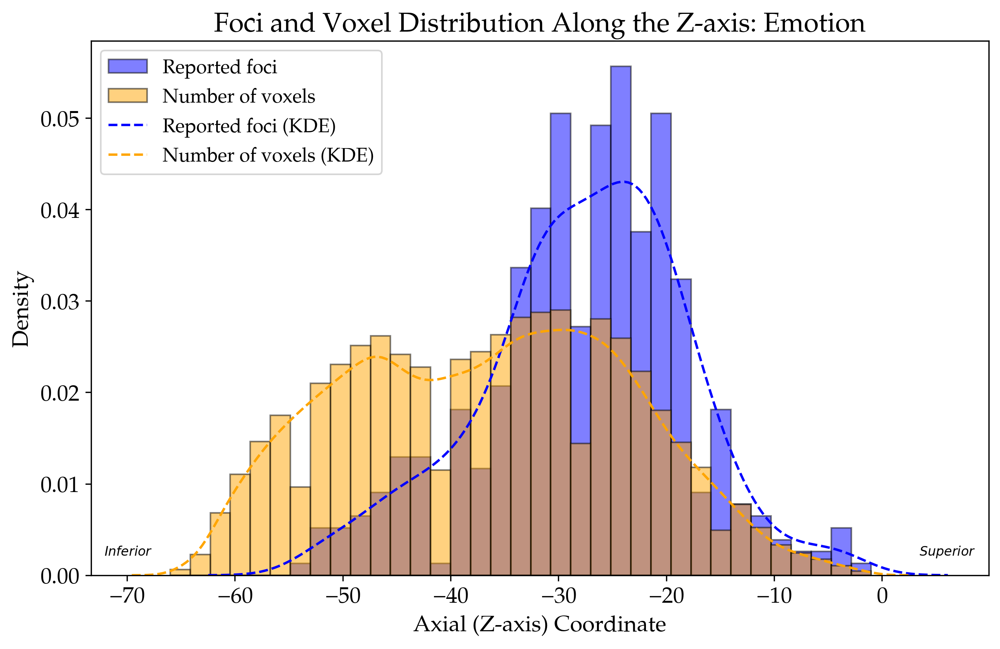

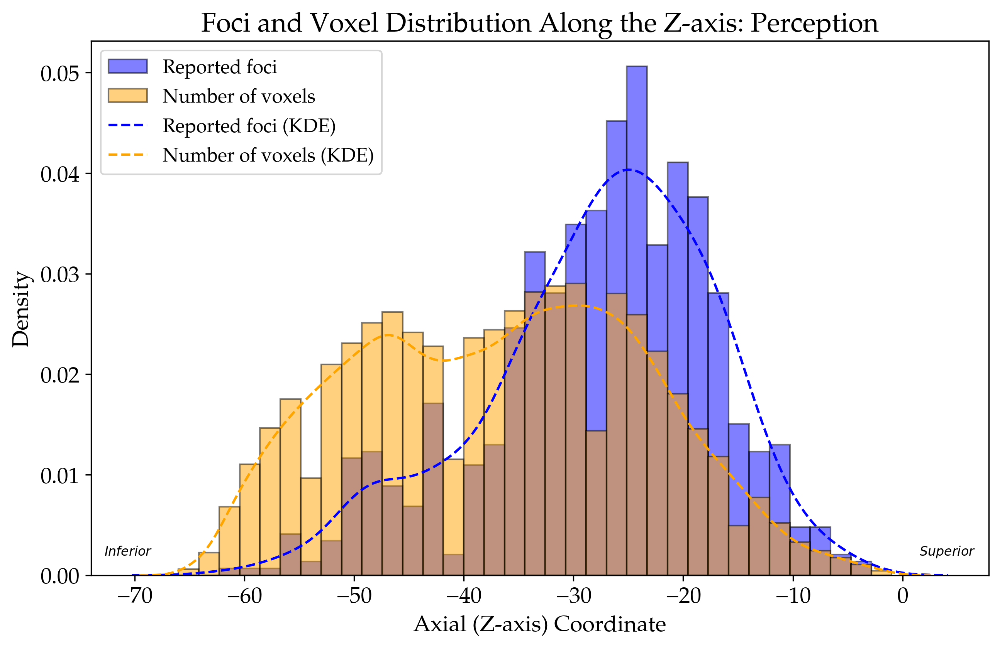

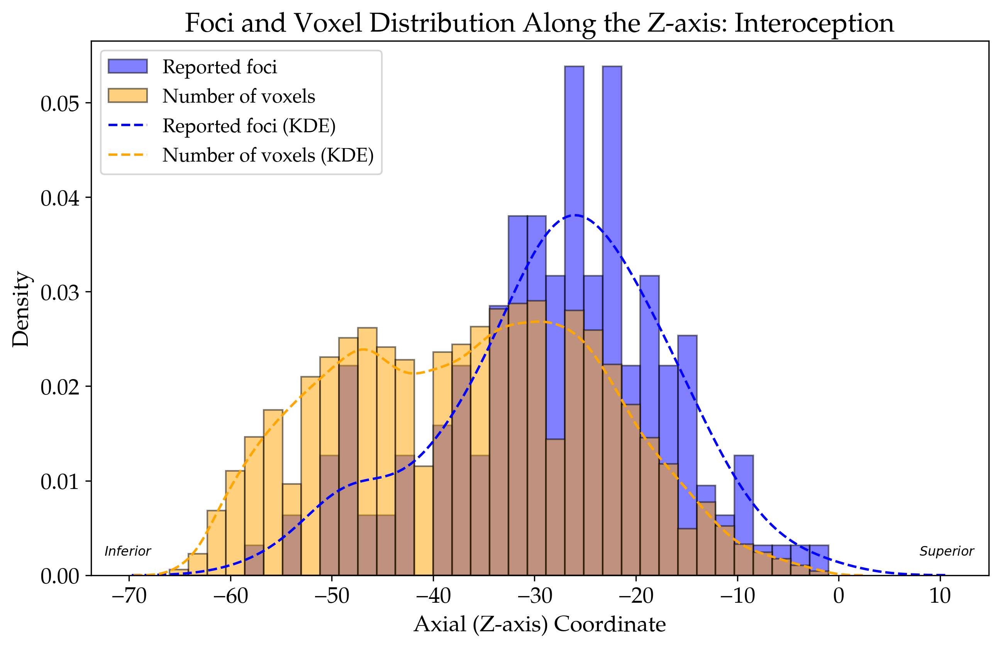

In [11]:
# Define bins using the z-coordinates from all domains and the mask
all_z_coords = np.concatenate([xyz_cerebellum_dict[domain][:, 2] for domain in domains] + [mask_xyz[:, 2]])
bins = np.histogram_bin_edges(all_z_coords, bins=35)

# Plot the histograms for each domain in separate figures
for domain in domains:
    plt.figure(figsize=(10, 6))

    # Determine common bin edges for the histograms
    bins = np.histogram_bin_edges(np.concatenate([xyz_cerebellum_dict[domain][:, 2], mask_xyz[:, 2]]), bins=35)
    
    # Plot the histogram for the reported effects
    plt.hist(xyz_cerebellum_dict[domain][:, 2], bins=bins, density=True, alpha=0.5, label='Reported foci', color='blue', edgecolor='black')
    
    # Plot the histogram for the number of voxels
    plt.hist(mask_xyz[:, 2], bins=bins, density=True, alpha=0.5, label='Number of voxels', color='orange', edgecolor='black')
    
    # Add KDE for smoothed distribution
    sns.kdeplot(xyz_cerebellum_dict[domain][:, 2], color='blue', label='Reported foci (KDE)', linestyle='--')
    sns.kdeplot(mask_xyz[:, 2], color='orange', label='Number of voxels (KDE)', linestyle='--')
    
    # Add legend and labels
    plt.legend(fontsize = 12, loc='upper left', bbox_to_anchor=(0.0, 1))
    plt.xlabel('Axial (Z-axis) Coordinate')
    plt.ylabel('Density')
    plt.title(f'Foci and Voxel Distribution Along the Z-axis: {domain.capitalize()}')

    # Add manual labels on the bottom left and right corners with offset
    x_offset = 0.015 * (plt.xlim()[1] - plt.xlim()[0])
    y_offset = 0.03 * (plt.ylim()[1] - plt.ylim()[0])
    
    plt.text(x=plt.xlim()[0] + x_offset, y=plt.ylim()[0] + y_offset, 
             s='$\mathit{Inferior}$', ha='left', va='bottom', fontsize=8)
    plt.text(x=plt.xlim()[1] - x_offset, y=plt.ylim()[0] + y_offset, 
             s='$\mathit{Superior}$', ha='right', va='bottom', fontsize=8)

# S2. Distribution of reported effects across whole brain

In [5]:
kernels_sum = utils.get_kernels_sum(dump_path)

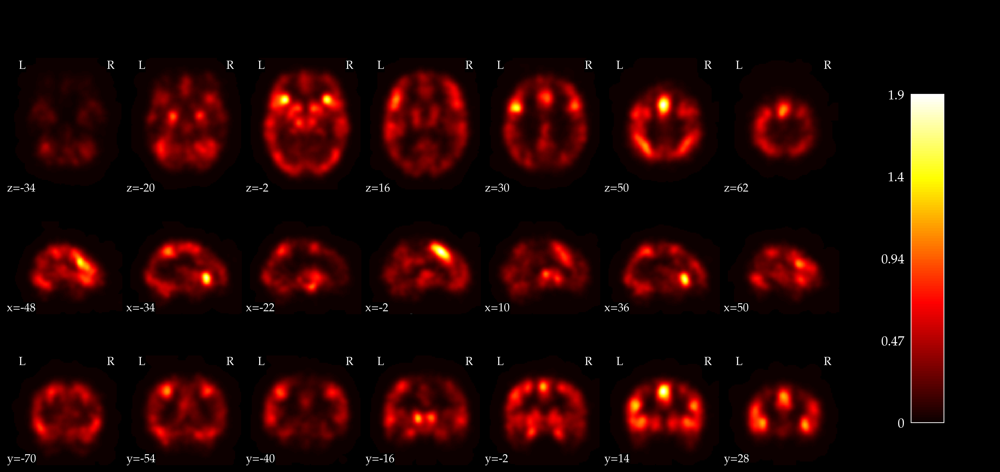

In [13]:
fig, ax = plt.subplots(figsize=(16, 8))
fig.patch.set_facecolor('black')

# Plot
display = plotting.plot_stat_map(
    kernels_sum, display_mode='mosaic', cut_coords=7, black_bg=True, colorbar=True,
    figure=fig, axes=ax
)

# Manually adjust color bar position to maximize figure space.
colorbar = display._cbar
colorbar.ax.set_position([0.95, 0.12, 0.03, 0.6])

# 1b. The sampling probability map in the cerebellum

Load the cerebellum dilated mask (used in the meta-analyses), mask the sum of kernels to it, and then normalize the sum to one.

We dilated the cerebellar mask 6mm in each direction to allow for effects slightly out of the mask (accounting for missalignments).

In [6]:
# create/load the dilated mask
cerebellum_mask_dilated = utils.create_Diedrichsen2009_mask('MNI', dilation=6)

# Resample the mask to the kernels sum map
cerebellum_mask_resampled = nilearn.image.resample_to_img(cerebellum_mask_dilated, kernels_sum, interpolation='nearest')

# normalize the sum to 1 to calculate sampling probability map in the cerebellum
kernels_sum_data = nibabel.load(kernels_sum).get_fdata()
kernels_sum_masked = kernels_sum_data[cerebellum_mask_resampled.get_fdata().astype(bool)]
sampling_prob = kernels_sum_masked / kernels_sum_masked.sum()

# project back the 1d sampling probability to 3D image
masker = nilearn.maskers.NiftiMasker(cerebellum_mask_resampled)
masker.fit()
sampling_prob_img = masker.inverse_transform(sampling_prob)
sampling_prob_surf = SUITPy.flatmap.vol_to_surf(sampling_prob_img, space='SPM').squeeze()

INFO:matplotlib.texmanager:font.family must be one of (serif, sans-serif, cursive, monospace) when text.usetex is True. serif will be used by default.
INFO:matplotlib.texmanager:font.family must be one of (serif, sans-serif, cursive, monospace) when text.usetex is True. serif will be used by default.
INFO:matplotlib.texmanager:font.family must be one of (serif, sans-serif, cursive, monospace) when text.usetex is True. serif will be used by default.
INFO:matplotlib.texmanager:font.family must be one of (serif, sans-serif, cursive, monospace) when text.usetex is True. serif will be used by default.
INFO:matplotlib.texmanager:font.family must be one of (serif, sans-serif, cursive, monospace) when text.usetex is True. serif will be used by default.
INFO:matplotlib.texmanager:font.family must be one of (serif, sans-serif, cursive, monospace) when text.usetex is True. serif will be used by default.
INFO:matplotlib.texmanager:font.family must be one of (serif, sans-serif, cursive, monospace) 

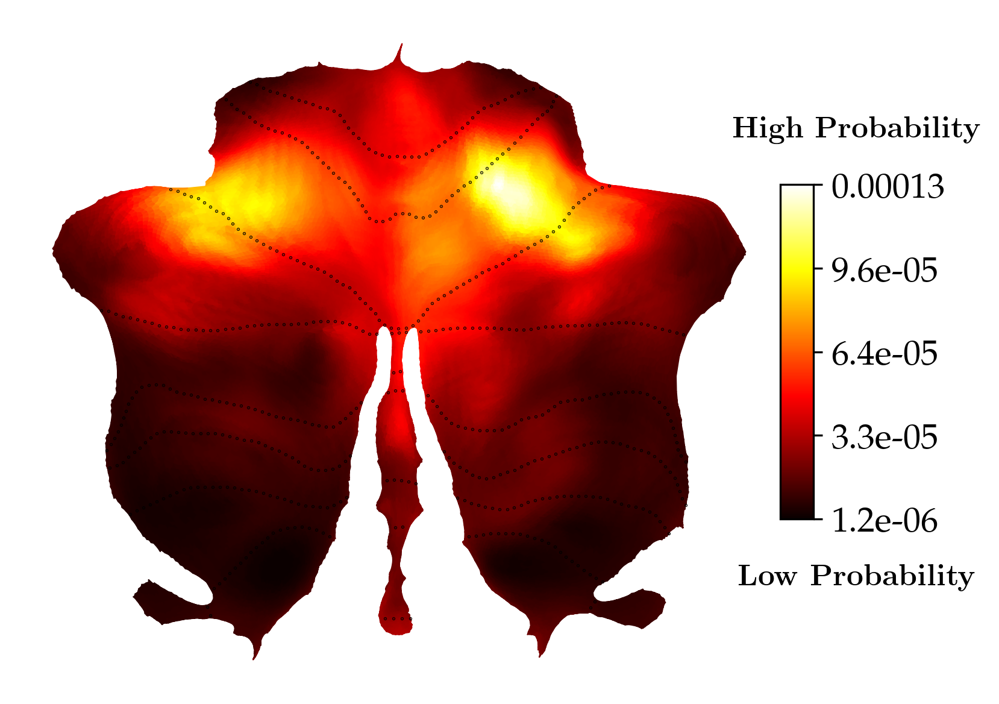

In [19]:
SUITPy.flatmap.plot(sampling_prob_surf, colorbar=True, new_figure=False, bordersize=0.5, cmap='hot')

# Get the current figure and axis
fig = plt.gcf()
ax = plt.gca()

# Add text labels to the figure with LaTeX formatting for bold text
plt.rcParams['text.usetex'] = True

fig.text(0.85, 0.235, r'$\textbf{Low Probability}$', va='center', ha='center', fontsize=12)
fig.text(0.85, 0.75, r'$\textbf{High Probability}$', va='center', ha='center', fontsize=12)

# # Disable LaTex (important if causing issues with further plotting fonts).
plt.rcParams['text.usetex'] = False

Inset: Plot the classic ALE sampling probability map which indicates uniform probability across voxels

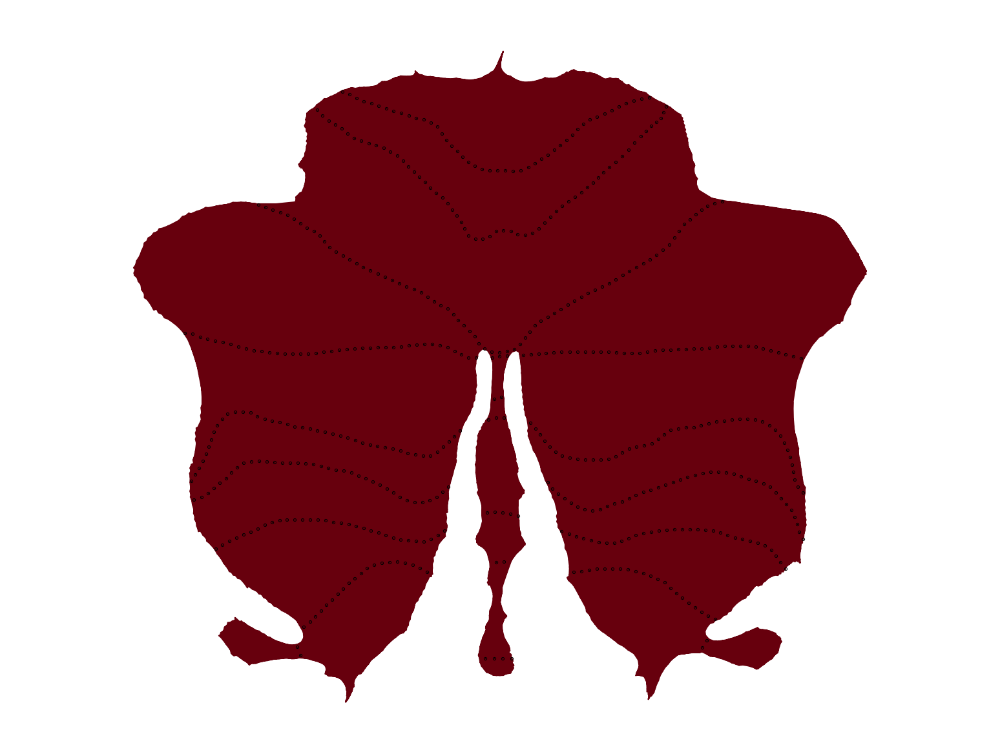

In [20]:
# Workaround to make a flat-colored cerebellar cerebellar flatmap.
# Extract the top color from the 'Reds' colormap
top_color = plt.cm.Reds(1.0)

# Create a custom colormap with the top color on both ends
cmap = mcolors.LinearSegmentedColormap.from_list('custom_reds', [top_color, top_color], N=256)

# Generate the map of a constant value
sampling_prob_surf_ale = np.full_like(sampling_prob_surf, 0.99)
# Assign first vertex to 0.98
sampling_prob_surf_ale[0] = 0.98

# Plot the flatmap using the custom colormap
SUITPy.flatmap.plot(sampling_prob_surf_ale, colorbar=False, new_figure=False, bordersize=0.5, cmap=cmap)

# Get the current figure and axis
fig = plt.gcf()
ax = plt.gca()

# 1c, d. Classic ALE and C-SALE result maps for Behavioral Domains

Get experiment stats:

In [2]:
# Obtain the number of experiments from the exp_stats.csv
if os.path.exists(os.path.join(OUTPUT_DIR, 'exp_stats.csv')):
    stats = pd.read_csv(os.path.join(OUTPUT_DIR, 'exp_stats.csv'), index_col=0)
# If the stats file does not exist, create it from json files
else:
    stats = []
    for stats_path in glob.glob(os.path.join(OUTPUT_DIR, 'SALE', '*', '*', 'stats.json')):
        
        # Use regular expression to extract the subbd value
        match = re.search(r'SALE/[^/]+/([^/]+)/stats\.json$', stats_path)
        if match:
            subbd = match.group(1)
        else:
            continue 
            
        with open(stats_path, 'r') as f:
            curr_stats = json.load(f)
        curr_stats['subbd'] = subbd
        stats.append(curr_stats)
    stats = pd.DataFrame(stats).set_index('subbd').sort_index()
    # write to csv
    stats.to_csv(os.path.join(OUTPUT_DIR, 'exp_stats.csv'))

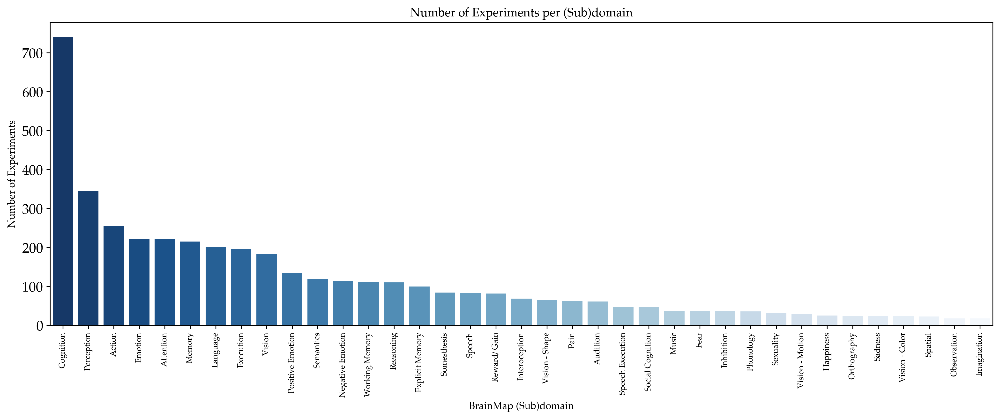

In [8]:
# Reset index so 'subbd' becomes a regular column
stats_sorted = stats.sort_values('n_exp', ascending=False).reset_index()

# Now 'subbd' is accessible, apply label mapping
label_mapping = utils.bd_labels  
stats_sorted["subbd_mapped"] = stats_sorted["subbd"].map(label_mapping).fillna(stats_sorted["subbd"])

# Set figure size
plt.figure(figsize=(14, 6))

# Create barplot
sns.barplot(x="subbd_mapped", y="n_exp", data=stats_sorted, palette="Blues_r")

# Adjust labels
plt.xticks(rotation=90, fontsize=8)
plt.xlabel("BrainMap (Sub)domain", fontsize=10)
plt.ylabel("Number of Experiments", fontsize=10)
plt.title("Number of Experiments per (Sub)domain", fontsize=12)

# Improve layout
plt.tight_layout()
plt.show()

Total number of studies, experiments, participants and foci:

In [5]:
dump = nimare.dataset.Dataset.load(os.path.join(OUTPUT_DIR, 'data', f'BrainMap_dump_Feb2024_mask-D2009_MNI_dilated-6mm.pkl.gz'))
# filter to activations
dump = dump.slice(dump.metadata.loc[dump.metadata['type']=='Activations', 'id'].values)

print("Studies:", len(dump.metadata['study_id'].unique()))
print("Experiments:", len(dump.metadata['id'].unique()))
print("Foci:", dump.coordinates.shape[0])
print("Participants:", dump.metadata.drop_duplicates('study_id')['sample_sizes'].map(lambda l: l[0]).sum())

Studies: 1109
Experiments: 2322
Foci: 4644
Participants: 16159


Whole-brain data (deactivations and activations):

In [7]:
dump_brain = nimare.dataset.Dataset.load(os.path.join(OUTPUT_DIR, 'data', f'BrainMap_dump_Feb2024.pkl.gz'))

print("Studies:", len(dump_brain.metadata['study_id'].unique()))
print("Experiments:", len(dump_brain.metadata['id'].unique()))
print("Foci:", dump_brain.coordinates.shape[0])
print("Participants:", dump_brain.metadata.drop_duplicates('study_id')['sample_sizes'].map(lambda l: l[0]).sum())

Studies: 2214
Experiments: 8408
Foci: 69703
Participants: 32660


Whole-brain data (deactivations and activations):

In [8]:
# filter to activations
dump_brain = dump_brain.slice(dump_brain.metadata.loc[dump_brain.metadata['type']=='Activations', 'id'].values)

print("Studies:", len(dump_brain.metadata['study_id'].unique()))
print("Experiments:", len(dump_brain.metadata['id'].unique()))
print("Foci:", dump_brain.coordinates.shape[0])
print("Participants:", dump_brain.metadata.drop_duplicates('study_id')['sample_sizes'].map(lambda l: l[0]).sum())

Studies: 2204
Experiments: 7771
Foci: 65606
Participants: 32530


In [9]:
# Initialize dictionaries to store results 
surf_zmaps = {}
surf_zmaps_thr = {}
surf_cluster_boundary_coords = {}
domains = utils.domains_list

for analysis in ['ALE', 'SALE']:
    surf_zmaps[analysis] = {}
    surf_zmaps_thr[analysis] = {}
    surf_cluster_boundary_coords[analysis] = {}
    for domain in domains:
        print(analysis, domain)
        try:
            results = utils.load_results(analysis, domain)
        except FileNotFoundError:
            print(f"(Un)corrected {analysis} results not found for {domain}")
            continue
        surf_zmaps[analysis][domain] = results[analysis][domain]['uncorr']
        surf_zmaps_thr[analysis][domain] = results[analysis][domain]['corr']
        surf_cluster_mask = (surf_zmaps_thr[analysis][domain] > 0).astype(int)
        surf_cluster_boundary_coords[analysis][domain] = utils.get_flatmap_mask_boundary_coords(surf_cluster_mask)

ALE Action
ALE Cognition
ALE Emotion
ALE Interoception
ALE Perception
SALE Action
SALE Cognition
SALE Emotion
SALE Interoception
SALE Perception


## 1c. Classic ALE BD-level results

Text(0.434, 1.15, 'Classic ALE')

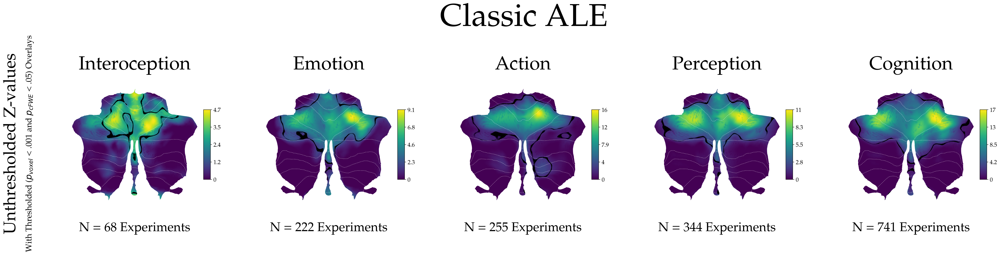

In [33]:
analysis = 'ALE'

# Create a new figure
fig = plt.figure(figsize=(40, 6)) 

# Order the domains based on the number of experiments
domain_order = stats.loc[domains, 'n_exp'].sort_values().index

# Loop over domains and create subplots for each of them
for i, domain in enumerate(domain_order):
    ax = fig.add_subplot(1,5, i + 1)

    # Plot themap for each domain
    SUITPy.flatmap.plot(surf_zmaps[analysis][domain], colorbar=True, new_figure=False, bordersize=0.5, cmap = 'viridis', bordercolor='white')

    # Overlay the cluster borders on top
    ax.plot(surf_cluster_boundary_coords[analysis][domain][:, 0], surf_cluster_boundary_coords[analysis][domain][:, 1], color='black',
           marker='.', linestyle=None, markersize=0.01, linewidth=0)
    # Set titles and labels as needed
    ax.set_title(f"{domain}", fontsize = 45)
    ax.text(0.5, -0.1, f'N = {stats.loc[domain, "n_exp"]} Experiments', fontsize=30, ha='center', va='center', transform=ax.transAxes)

# Add a rotated y-label for the entire plot
fig.text(0.08, 0.5, 'Unthresholded Z-values', va='center', ha='center', rotation='vertical', fontsize=40)

# Add a subtitle for the y-label
fig.text(0.095, 0.5, 'With Thresholded ($\mathit{p_{voxel}}$ < .001 and $\mathit{p_{cFWE}}$ < .05) Overlays', va='center', ha='center', rotation='vertical', fontsize=20)

fig.text(0.434, 1.15, 'Classic ALE', fontsize=75)

## 1d. Cerebellum-specific ALE BD-level results

Text(0.355, 1.15, 'Cerebellum-specific ALE')

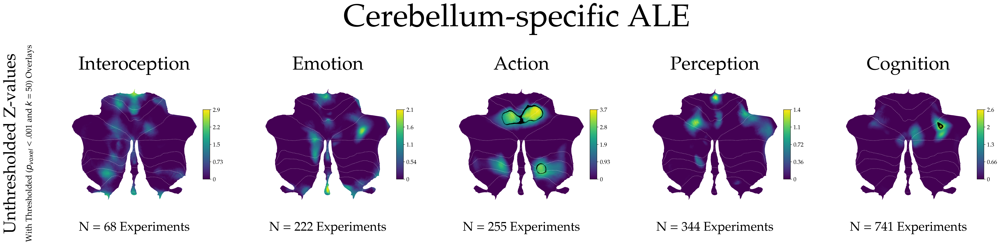

In [34]:
analysis = 'SALE'

# Create a new figure
fig = plt.figure(figsize=(40, 6))

# Loop over domains and create subplots for each of them
for i, domain in enumerate(domain_order):
    ax = fig.add_subplot(1,5, i + 1)

    # Plot themap for each domain
    SUITPy.flatmap.plot(surf_zmaps[analysis][domain], colorbar=True, new_figure=False, bordersize=0.5, cmap = 'viridis', bordercolor='white')

    # Overlay the cluster borders on top
    ax.plot(surf_cluster_boundary_coords[analysis][domain][:, 0], surf_cluster_boundary_coords[analysis][domain][:, 1], color='black',
           marker='.', linestyle=None, markersize=0.01, linewidth=0)
    # Set titles and labels as needed
    ax.set_title(f"{domain}", fontsize = 45)
    ax.text(0.5, -0.1, f'N = {stats.loc[domain, "n_exp"]} Experiments', fontsize=30, ha='center', va='center', transform=ax.transAxes)

# Add a rotated y-label for the entire plot
fig.text(0.08, 0.5, 'Unthresholded Z-values', va='center', ha='center', rotation='vertical', fontsize=40)

# Add a subtitle for the y-label
fig.text(0.095, 0.5, 'With Thresholded ($\mathit{p_{voxel}}$ < .001 and $\mathit{k}$ = 50) Overlays', va='center', ha='center', rotation='vertical', fontsize=20)

fig.text(0.355, 1.15, 'Cerebellum-specific ALE', fontsize=75)

# 1e. Cross-correlation of uncorrected Z-maps

Load sub-BD Z-maps:

In [10]:
subbd_surf_zmaps = {}
subbd_surf_zmaps_thr = {}

for analysis in ['ALE', 'SALE']:
    subbd_surf_zmaps[analysis] = {}
    subbd_surf_zmaps_thr[analysis] = {}
    for subdomain in utils.subdomains_with_domains:
        # Split into domain and subdomain (e.g., "Action.Execution")
        domain, subdomain_name = subdomain.split('.', 1)
        print(f"Loading {analysis} results for {subdomain}")
        try:
            results = utils.load_results(analysis, domain, subdomain=subdomain_name)
        except FileNotFoundError:
            print(f"(Un)corrected {analysis} results not found for {subdomain}")
            continue
        subbd_surf_zmaps[analysis][subdomain] = results[analysis][subdomain]['uncorr']
        subbd_surf_zmaps_thr[analysis][subdomain] = results[analysis][subdomain]['corr']

Loading ALE results for Action.Execution
Loading ALE results for Action.Execution.Speech
Loading ALE results for Action.Imagination
Loading ALE results for Action.Inhibition
Loading ALE results for Action.MotorLearning
(Un)corrected ALE results not found for Action.MotorLearning
Loading ALE results for Action.Observation
Loading ALE results for Action.Preparation
(Un)corrected ALE results not found for Action.Preparation
Loading ALE results for Cognition.Attention
Loading ALE results for Cognition.Language
Loading ALE results for Cognition.Language.Orthography
Loading ALE results for Cognition.Language.Phonology
Loading ALE results for Cognition.Language.Semantics
Loading ALE results for Cognition.Language.Speech
Loading ALE results for Cognition.Language.Syntax
(Un)corrected ALE results not found for Cognition.Language.Syntax
Loading ALE results for Cognition.Memory
Loading ALE results for Cognition.Memory.Explicit
Loading ALE results for Cognition.Memory.Working
Loading ALE results f

Text(-0.2178347937497886, -0.5, 'T = 62.64, p < 0.001$^*$')

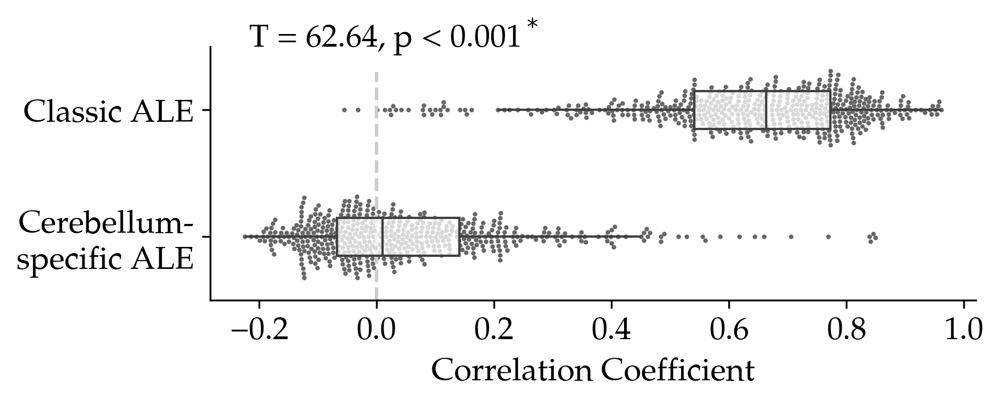

In [11]:
cross_corr = {}
for method in ['ALE', 'SALE']:
    cross_corr[method] = np.concatenate([
        pd.DataFrame(surf_zmaps[method]).corr().values[np.tril_indices(len(surf_zmaps[method]), -1)],
        pd.DataFrame(subbd_surf_zmaps[method]).corr().values[np.tril_indices(len(subbd_surf_zmaps[method]), -1)],
    ])
cross_corr = pd.DataFrame(cross_corr)

fig, ax = plt.subplots(figsize=(6, 2))
plot_data = cross_corr.unstack().reset_index()
ax.axvline(0, color='.8', ls='--', ymax=0.9)
sns.swarmplot(
    data=plot_data,
    y='level_0', x=0,
    s=2, color='.4',
    ax=ax
)
sns.boxplot(
    data=plot_data,
    y='level_0', x=0,
    showfliers=False,
    showcaps=False, width=0.3,
    boxprops={"facecolor": (1, 1, 1, 0.75)},
    ax=ax)
plt.setp(ax.collections, zorder=0, label="") # puts swarm in the back
ax.set_xlabel('Correlation Coefficient')
ax.set_yticklabels(['Classic ALE', 'Cerebellum-\nspecific ALE'])
ax.set_ylabel('')
sns.despine()
# add statistics
t, p = scipy.stats.ttest_rel(
    cross_corr['ALE'], 
    cross_corr['SALE'])
if p > 0.001:
    text = f'T = {t:.2f}, p = {p:.3f}'
else:
    text = f'T = {t:.2f}, p < 0.001'
if p < 0.05:
    text+=r'$^*$'
text_x = ax.get_xlim()[0]+(ax.get_xlim()[1]-ax.get_xlim()[0])*0.05
text_y = ax.get_ylim()[0]+(ax.get_ylim()[1]-ax.get_ylim()[0])*1
ax.text(text_x, text_y, 
        text,
        color='black',
        size=14,
        multialignment='left')

In [12]:
cross_corr.describe().round(2)

,ALE,SALE
count,506.00,506.00
mean,0.63,0.05
std,0.20,0.18
min,-0.06,-0.22
25%,0.54,-0.07
50%,0.66,0.01
75%,0.77,0.14
max,0.96,0.85


# 1f. Correlation of uncorrected Z-maps with baseline probability map

In [13]:
prob_corr = {
    'ALE': [],
    'SALE': []
}
for method in ['ALE', 'SALE']:
    for bd in surf_zmaps[method]:
        prob_corr[method].append(
            scipy.stats.pearsonr(surf_zmaps[method][bd], sampling_prob_surf).statistic
        )
    for subbd in subbd_surf_zmaps[method]:
        prob_corr[method].append(
            scipy.stats.pearsonr(subbd_surf_zmaps[method][subbd], sampling_prob_surf).statistic
        )

prob_corr = pd.DataFrame(prob_corr)

Text(-0.2904883141258037, -0.5, 'T = 20.53, p < 0.001$^*$')

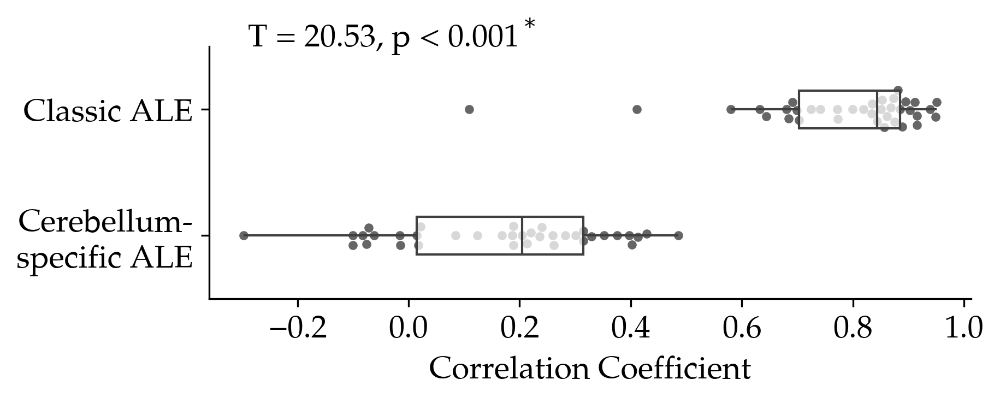

In [14]:
fig, ax = plt.subplots(figsize=(6, 2))
plot_data = prob_corr.unstack().reset_index()
sns.swarmplot(
    data=plot_data,
    y='level_0', x=0,
    s=4, color='.4',
    ax=ax
)
sns.boxplot(
    data=plot_data,
    y='level_0', x=0,
    showfliers=False,
    showcaps=False, width=0.3,
    boxprops={"facecolor": (1, 1, 1, 0.75)},
    ax=ax)
plt.setp(ax.collections, zorder=0, label="") # puts swarm in the back
ax.set_xlabel('Correlation Coefficient')
ax.set_yticklabels(['Classic ALE', 'Cerebellum-\nspecific ALE'])
ax.set_ylabel('')
sns.despine()
# add statistics
t, p = scipy.stats.ttest_rel(
    prob_corr['ALE'], 
    prob_corr['SALE'])
if p > 0.001:
    text = f'T = {t:.2f}, p = {p:.3f}'
else:
    text = f'T = {t:.2f}, p < 0.001'
if p < 0.05:
    text+=r'$^*$'
text_x = ax.get_xlim()[0]+(ax.get_xlim()[1]-ax.get_xlim()[0])*0.05
text_y = ax.get_ylim()[0]+(ax.get_ylim()[1]-ax.get_ylim()[0])*1
ax.text(text_x, text_y, 
        text,
        color='black',
        size=14,
        multialignment='left')

In [15]:
prob_corr.describe().round(2)

,ALE,SALE
count,37.00,37.00
mean,0.78,0.17
std,0.16,0.19
min,0.11,-0.30
25%,0.70,0.02
50%,0.84,0.20
75%,0.88,0.31
max,0.95,0.49


# S3. Full correlation matrices for behavioral domains.

Text(0.5, 1.05, 'Classic ALE')

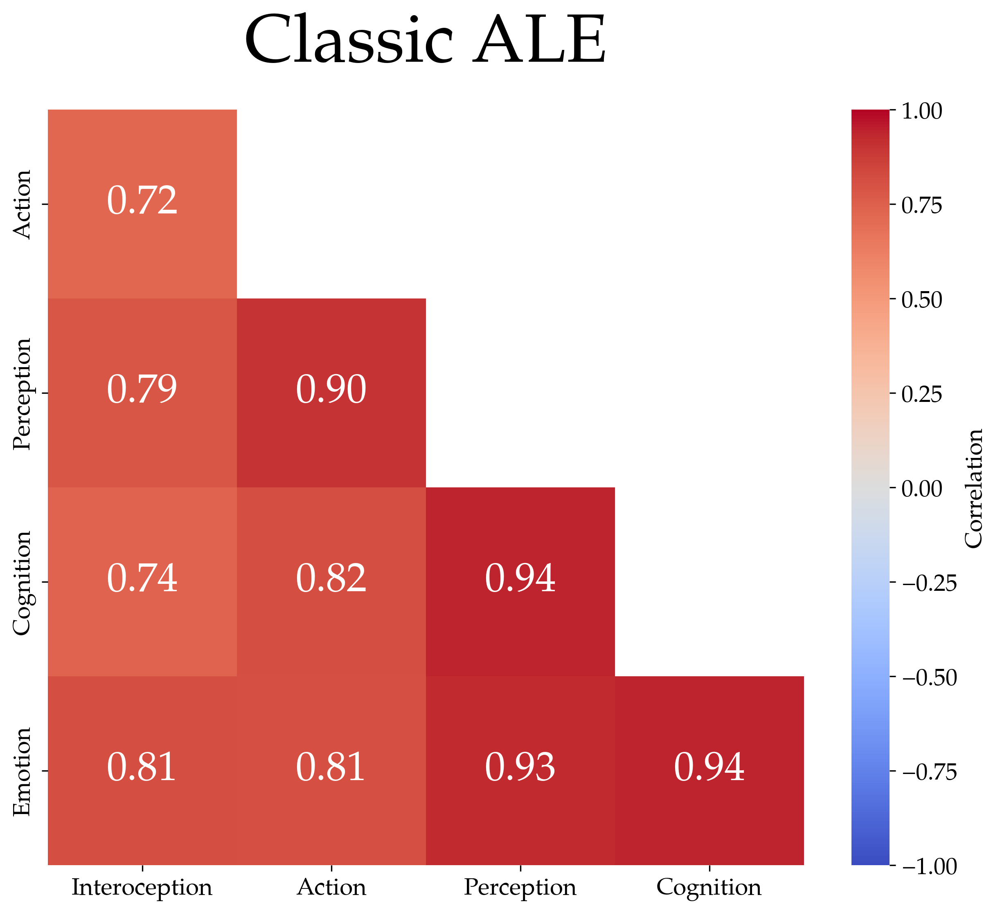

In [41]:
# Initialize the cross-correlation DataFrame
bd_cross_corr = pd.DataFrame(surf_zmaps['ALE']).corr()
# Hierarchical clustering
_, _, ordered_leaves = utils.hierarchical_clustering(bd_cross_corr, no_plot=True)
# Reorder the correlation matrix
bd_ordered_cross_corr = bd_cross_corr.iloc[ordered_leaves, ordered_leaves]
# set diagonal and upper tirangle to nan
bd_ordered_cross_corr.values[np.triu_indices_from(bd_ordered_cross_corr, 0)] = np.NaN
# Plot the reordered correlation matrix using a heatmap
plt.figure(figsize=(10, 8))
ax = sns.heatmap(
    bd_ordered_cross_corr, 
    annot=True, 
    fmt=".2f", 
    cmap='coolwarm', 
    cbar_kws={'label': 'Correlation'}, 
    annot_kws={"fontsize": 24}, 
    center=0.0, 
    square=True,
    vmin=-1,
    vmax=1
)
# remove the trailing empty rows and columns
ax.set_xlim([0, bd_cross_corr.shape[1]-1])
ax.set_ylim([bd_cross_corr.shape[1], 1])
plt.title('Classic ALE', y = 1.05, fontsize = 40)

Text(0.5, 1.05, 'Cerebellum-specific ALE')

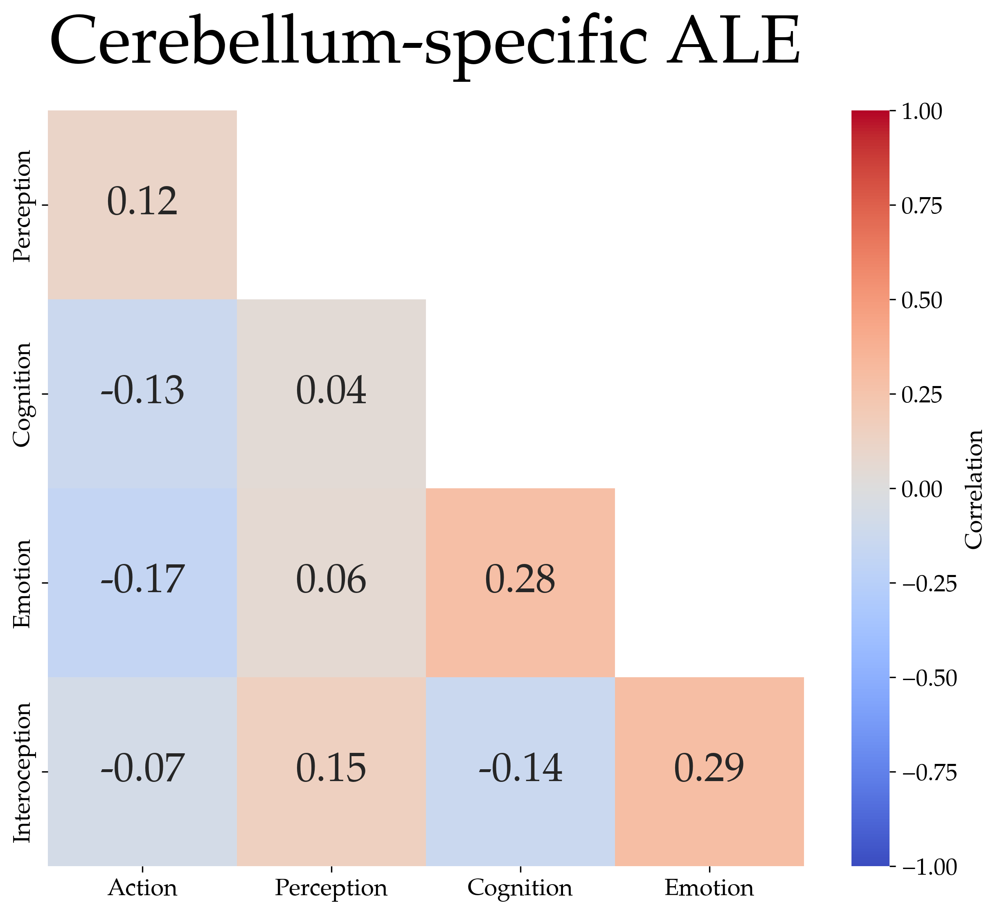

In [42]:
# Initialize the cross-correlation DataFrame
bd_cross_corr = pd.DataFrame(surf_zmaps['SALE']).corr()
# Hiearchical clustering
_, _, ordered_leaves = utils.hierarchical_clustering(bd_cross_corr, no_plot=True)
# Reorder the correlation matrix
bd_ordered_cross_corr = bd_cross_corr.iloc[ordered_leaves, ordered_leaves]
# set diagonal and upper tirangle to nan
bd_ordered_cross_corr.values[np.triu_indices_from(bd_ordered_cross_corr, 0)] = np.NaN
# Plot the reordered correlation matrix using a heatmap
plt.figure(figsize=(10, 8))
ax = sns.heatmap(
    bd_ordered_cross_corr, 
    annot=True, 
    fmt=".2f", 
    cmap='coolwarm', 
    cbar_kws={'label': 'Correlation'}, 
    annot_kws={"fontsize": 24}, 
    center=0.0, 
    square=True,
    vmin=-1,
    vmax=1
)
# remove the trailing empty rows and columns
ax.set_xlim([0, bd_cross_corr.shape[1]-1])
ax.set_ylim([bd_cross_corr.shape[1], 1])
plt.title('Cerebellum-specific ALE', y = 1.05, fontsize = 40) 

# S4. Full correlation matrices for behavioral subdomains.

### S4a. Classic ALE

Text(0.5, 1.05, 'Classic ALE')

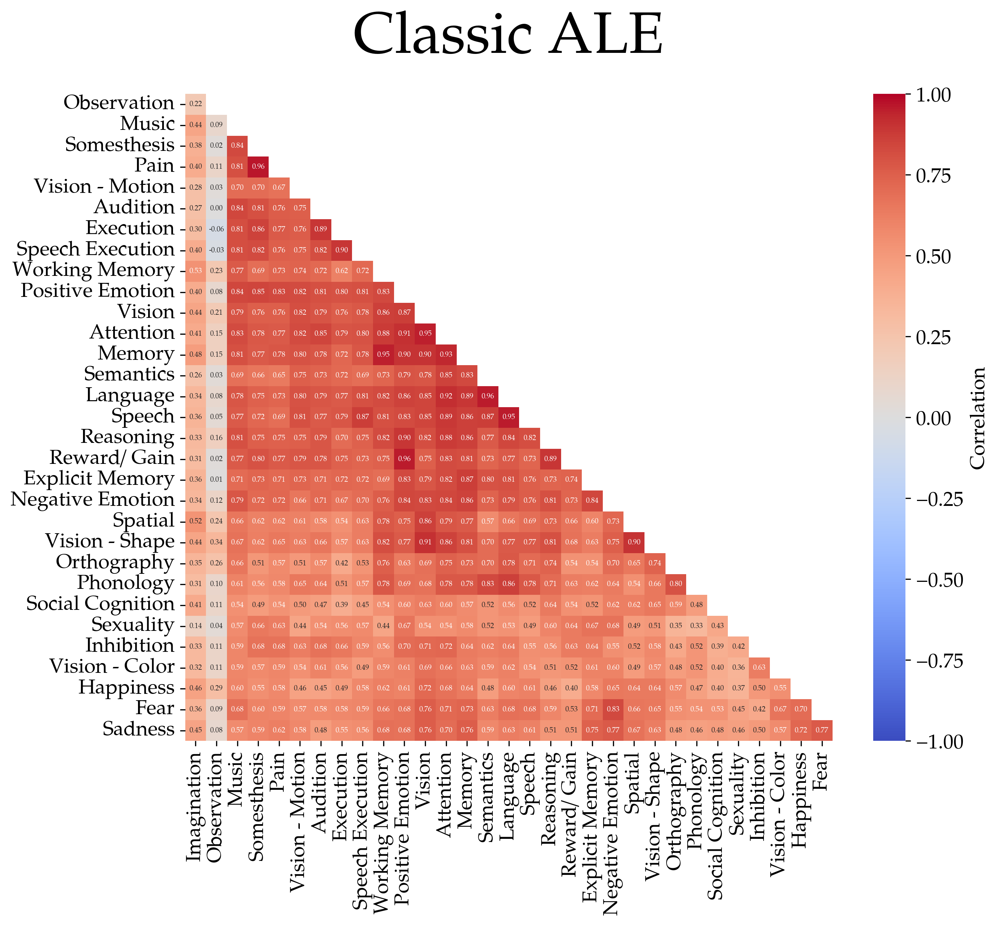

In [16]:
# Initialize the cross-correlation DataFrame
subbd_cross_corr = pd.DataFrame(subbd_surf_zmaps['ALE']).corr()
# Set clean labels
subbd_cross_corr.index = subbd_cross_corr.columns = subbd_cross_corr.index.map(utils.bd_labels.get)
# Hierarchical clustering
_, _, ordered_leaves = utils.hierarchical_clustering(subbd_cross_corr, no_plot=True)
# Reorder the correlation matrix
subbd_ordered_cross_corr = subbd_cross_corr.iloc[ordered_leaves, ordered_leaves]
# set diagonal and upper tirangle to nan
subbd_ordered_cross_corr.values[np.triu_indices_from(subbd_ordered_cross_corr, 0)] = np.NaN
# Plot the reordered correlation matrix using a heatmap
plt.figure(figsize=(10, 8))
ax = sns.heatmap(
    subbd_ordered_cross_corr, 
    annot=True, 
    fmt=".2f", 
    cmap='coolwarm', 
    cbar_kws={'label': 'Correlation'}, 
    annot_kws={"fontsize": 5}, 
    center=0.0, 
    square=True,
    vmin=-1,
    vmax=1,
    xticklabels=True, # force all tick labels
    yticklabels=True
)
# remove the trailing empty rows and columns
ax.set_xlim([0, subbd_cross_corr.shape[1]-1])
ax.set_ylim([subbd_cross_corr.shape[1], 1])
plt.title('Classic ALE', y = 1.05, fontsize = 40)

### S4b. Cerebellum-specific ALE

Text(0.5, 1.05, 'Cerebellum-specific ALE')

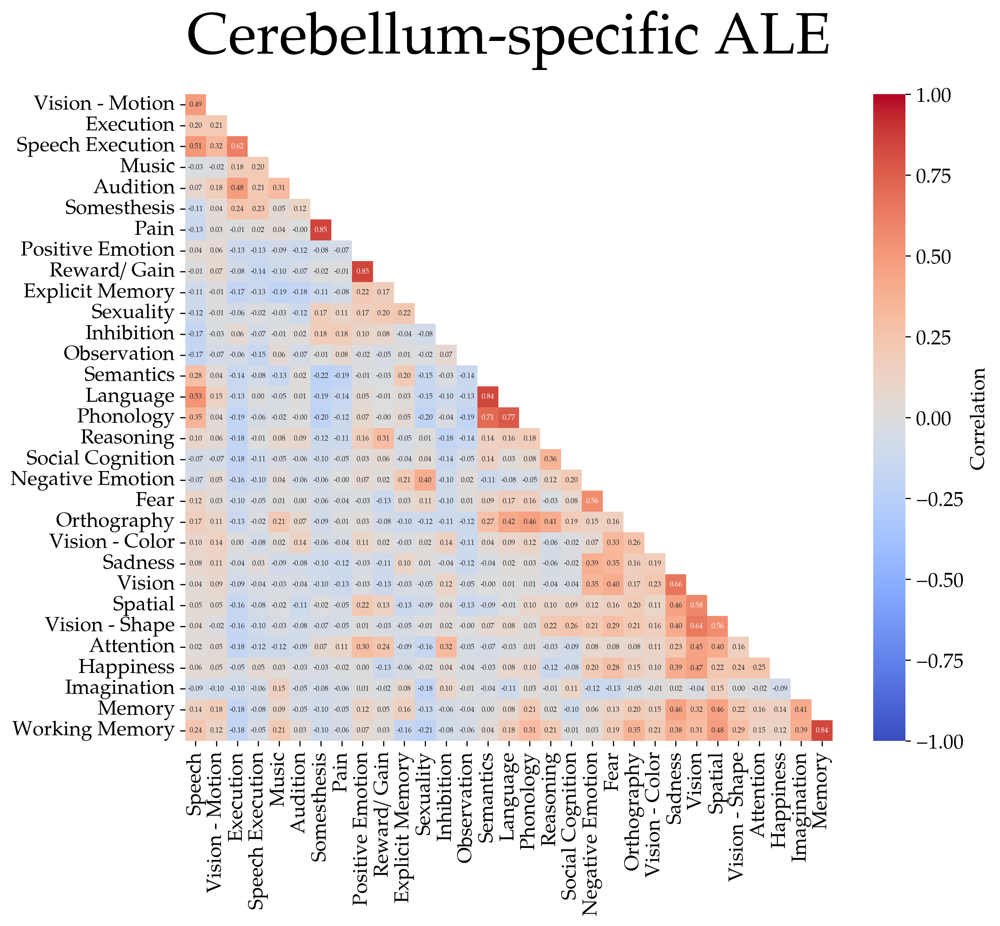

In [17]:
# Initialize the cross-correlation DataFrame
subbd_cross_corr = pd.DataFrame(subbd_surf_zmaps['SALE']).corr()
# Set clean labels
subbd_cross_corr.index = subbd_cross_corr.columns = subbd_cross_corr.index.map(utils.bd_labels.get)
# Hierarchical clustering
_, _, ordered_leaves = utils.hierarchical_clustering(subbd_cross_corr, no_plot=True)
# Reorder the correlation matrix
subbd_ordered_cross_corr = subbd_cross_corr.iloc[ordered_leaves, ordered_leaves]
# set diagonal and upper tirangle to nan
subbd_ordered_cross_corr.values[np.triu_indices_from(subbd_ordered_cross_corr, 0)] = np.NaN
# Plot the reordered correlation matrix using a heatmap
plt.figure(figsize=(10, 8))
ax = sns.heatmap(
    subbd_ordered_cross_corr, 
    annot=True, 
    fmt=".2f", 
    cmap='coolwarm', 
    cbar_kws={'label': 'Correlation'}, 
    annot_kws={"fontsize": 5}, 
    center=0.0, 
    square=True,
    vmin=-1,
    vmax=1,
    xticklabels=True, # force all tick labels
    yticklabels=True
)
# remove the trailing empty rows and columns
ax.set_xlim([0, subbd_cross_corr.shape[1]-1])
ax.set_ylim([subbd_cross_corr.shape[1], 1])
plt.title('Cerebellum-specific ALE', y = 1.05, fontsize = 40)